In [1]:
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

# replicate Meshal's pretty plotting colors
from matplotlib import colors
gray_red = colors.LinearSegmentedColormap.from_list("grouping", ["lightgray", "red", "darkred"], N = 128)

from utils import enrich

sc.set_figure_params(dpi=100, frameon=False)

In [2]:
import seaborn as sns

In [3]:
sc.logging.print_header()

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.23.4 scipy==1.9.3 pandas==1.5.1 scikit-learn==1.1.3 statsmodels==0.13.2 pynndescent==0.5.7


In [4]:
adata = sc.read('2301_annot_patient_integrated_ambient_removed.h5ad') #sc.read('211015_annot_patient_integrated.h5ad')

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


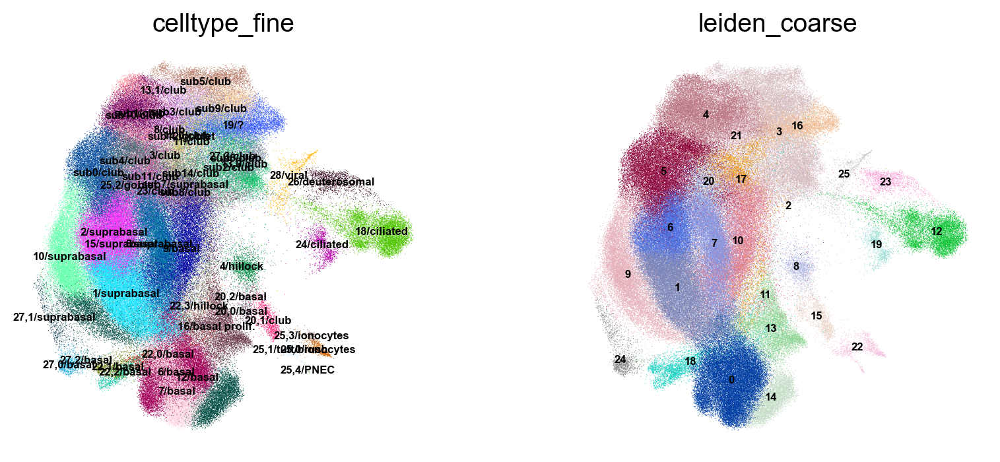

In [5]:
sc.pl.umap(adata, color=['celltype_fine', 'leiden_coarse'], legend_loc='on data', legend_fontsize=6)

In [6]:
sc.tl.dendrogram(adata, groupby='celltype_fine')  # replace with actual order after

In [7]:
def std_plot(genes, dotplot=True, **kwargs):
    sc.pl.umap(adata, color=genes, cmap=gray_red)
    if dotplot:
        sc.pl.dotplot(
            adata,
            var_names=genes,
            groupby='celltype_fine',
            standard_scale='var',
#             dendrogram=True,
            swap_axes=True,
            **kwargs
        )
        sc.pl.dotplot(
            adata,
            var_names=genes,
            groupby='cell_type',
            standard_scale='var',
#             dendrogram=True,
            swap_axes=True,
            **kwargs
        )

Infection.

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


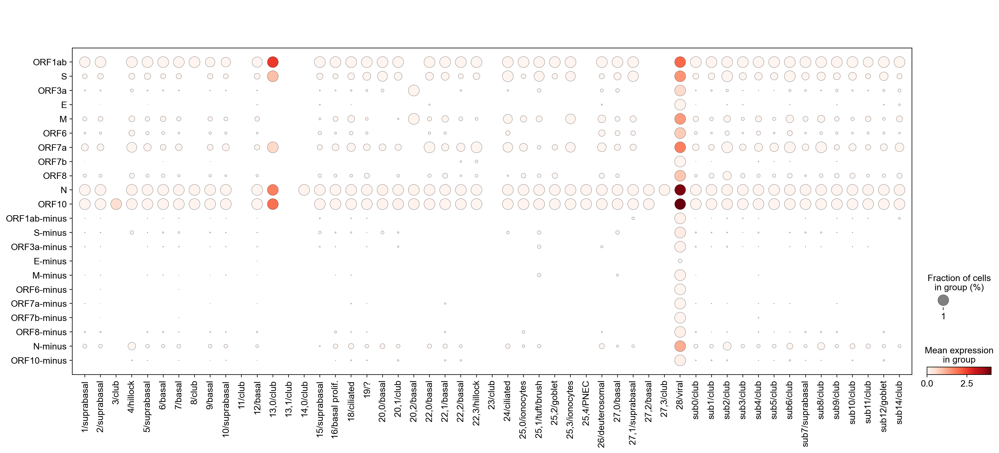

In [8]:
sc.pl.dotplot(
    adata[adata.obs.celltype_fine != '40/viral'],
    var_names=list(adata.var_names[-22:]),
    groupby='celltype_fine', swap_axes=True, dot_max=.01)

In [9]:
# sc.pl.dotplot(
#     adata[adata.obs.celltype_fine.isin(['1/basal', '2/club', '17/club', '20/basal', '25/basal', '31/unk', '39/club'])],
#     var_names=list(adata.var_names[-22:]),
#     groupby='infected', swap_axes=True, dot_max=.01)
# sc.pl.dotplot(
#     adata[~adata.obs.celltype_fine.isin(['1/basal', '2/club', '17/club', '20/basal', '25/basal', '31/unk', '39/club'])],
#     var_names=list(adata.var_names[-22:]),
#     groupby='infected', swap_axes=True, dot_max=.01)

## cell removal

I think... viral infection caused some apoptosing or cell leakage that created a bunch of pseudo-celltypes bc of ambient RNA mixing, which also explains the lack of label because of the likelihood of mixed tags from exploded cell membranes. None of these clusters are real cell types, and they are in enriched in viral reads because infected cells were more likely to explode. The viral cluster we see is from cells which were successfully sequenced before exploding. The reason we see so few infected cells is bc they all exploded, not because our MOI did not induce a great degree of infection. We can alternatively treat all these cells as a bulk sample.

In [28]:
subset = adata[adata.obs.treatment != 'nan'].copy()

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


<AxesSubplot: >

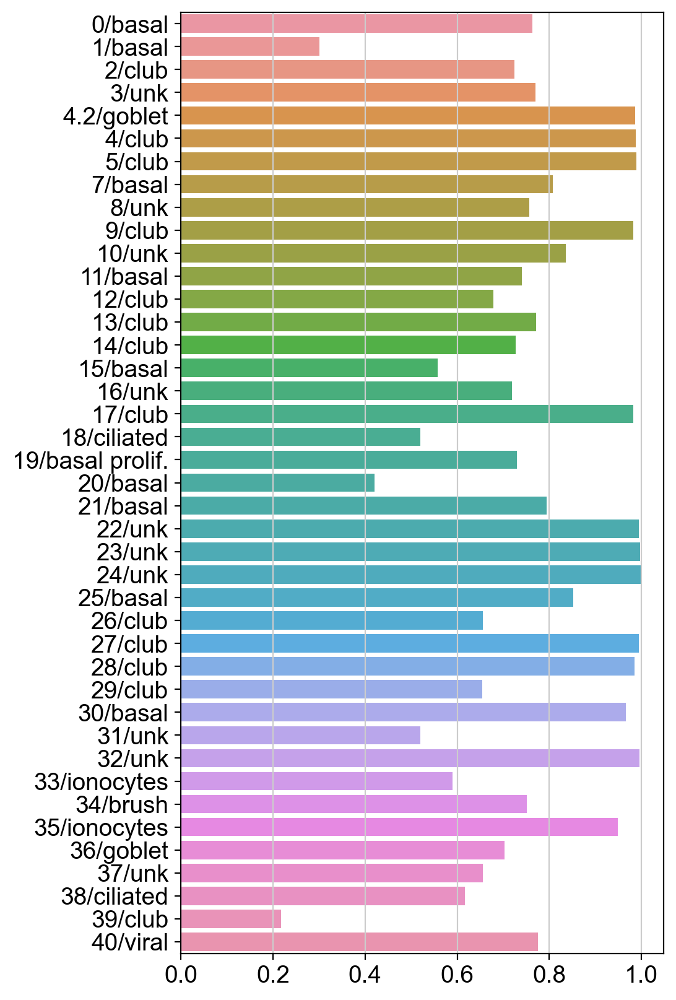

In [50]:
freq_df = pd.DataFrame(subset.obs.celltype_fine.value_counts()[subset.obs.celltype_fine.cat.categories]/adata.obs.celltype_fine.value_counts()[subset.obs.celltype_fine.cat.categories])
plt.figure(figsize=(5, 10))
sns.barplot(freq_df.T, orient='h')

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


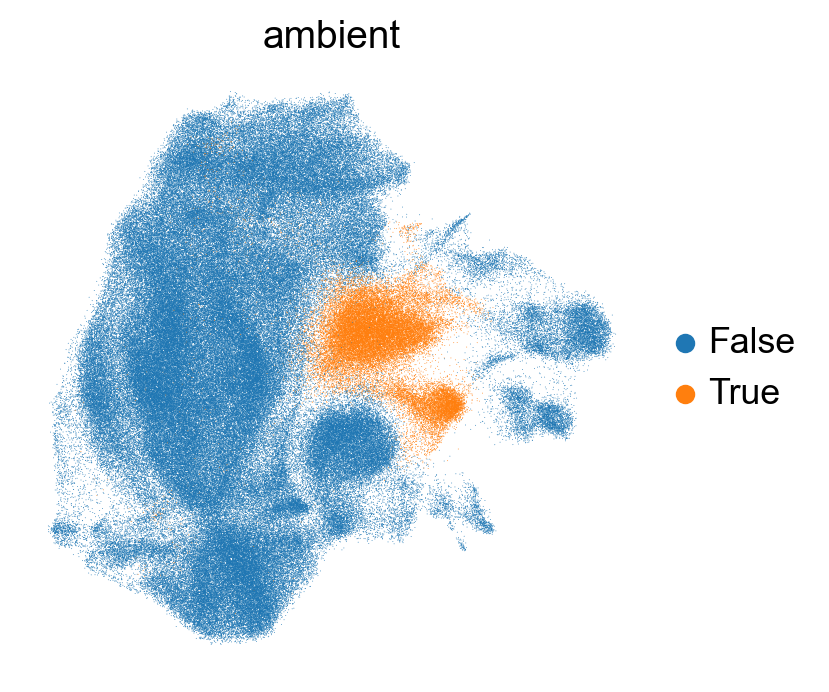

In [99]:
adata.obs['ambient'] = 'False'
adata.obs['ambient'][adata.obs.celltype_fine.isin(freq_df.index[(freq_df.celltype_fine < .5)].tolist())] = 'True'
sc.pl.umap(adata, color='ambient')

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


<AxesSubplot: ylabel='celltype_fine'>

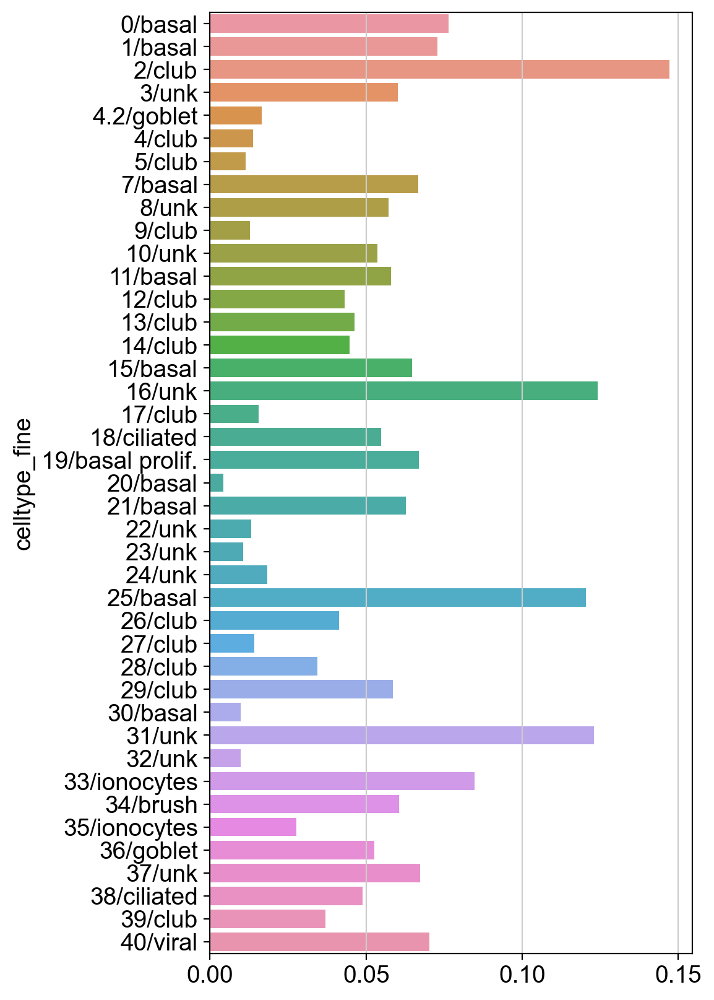

In [100]:
mito_df = pd.DataFrame(adata.obs.groupby(by='celltype_fine').percent_mito.mean())
plt.figure(figsize=(5, 10))
sns.barplot(mito_df.T, orient='h')

In [ ]:
adata.obs['mito'] = 'False'
adata.obs['ambient'][adata.obs.celltype_fine.isin(freq_df.index[(freq_df.celltype_fine < .5)].tolist())] = 'True'
sc.pl.umap(adata, color='ambient')

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


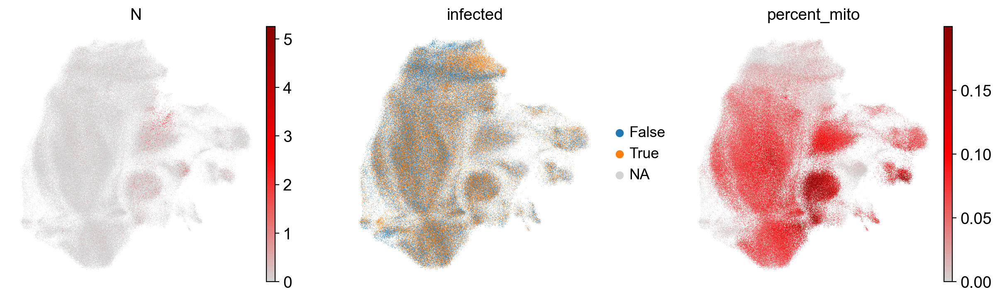

In [93]:
sc.pl.umap(adata[adata.obs.celltype_fine != '40/viral'], color=['N', 'infected', 'percent_mito'], cmap=gray_red)

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


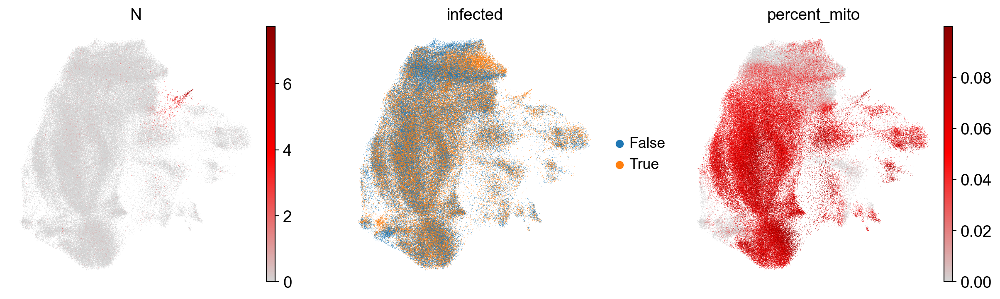

In [106]:
sc.pl.umap(adata[(adata.obs.percent_mito < .1) & (adata.obs.treatment != 'nan')], color=['N', 'infected', 'percent_mito'], cmap=gray_red)

In [107]:
new_adata = adata[(adata.obs.percent_mito < .1) & (adata.obs.treatment != 'nan')].copy()

In [117]:
new_adata

AnnData object with n_obs × n_vars = 191044 × 18115
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label', '_scvi_batch', '_scvi_labels', 'celltype_fine', 'ambient'
    var: 'used_for_scvi'
    uns: '_scvi', 'cell_type_colors', 'celltype_fine_colors', 'hvg', 'infected_colors', 'leiden', 'neighbors', 'patient_colors', 'rank_genes_groups', 'treatment_colors', 'umap', 'dendrogram_celltype_fine', 'ambient_colors'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [110]:
adata

AnnData object with n_obs × n_vars = 300353 × 18115
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label', '_scvi_batch', '_scvi_labels', 'celltype_fine', 'ambient'
    var: 'used_for_scvi'
    uns: '_scvi', 'cell_type_colors', 'celltype_coarse_colors', 'celltype_fine_colors', 'hvg', 'infected_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'rank_genes_groups', 'treatment_colors', 'umap', 'dendrogram_celltype_fine', 'ambient_colors'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [112]:
sc.pp.neighbors(new_adata, use_rep='X_scVI')

In [113]:
sc.tl.umap(new_adata)

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


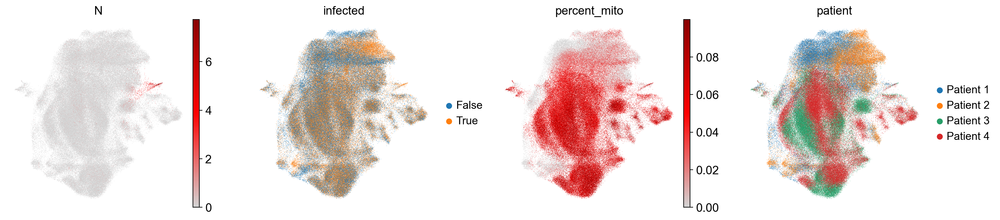

In [116]:
sc.pl.umap(new_adata, color=['N', 'infected', 'percent_mito', 'patient'], cmap=gray_red)

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


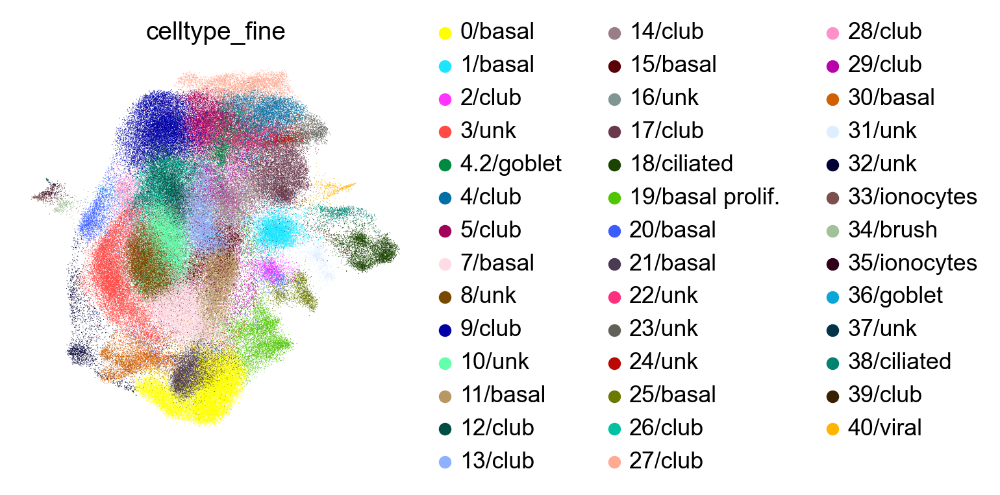

In [115]:
sc.pl.umap(new_adata, color='celltype_fine')

## continue

Receptors required for infection.

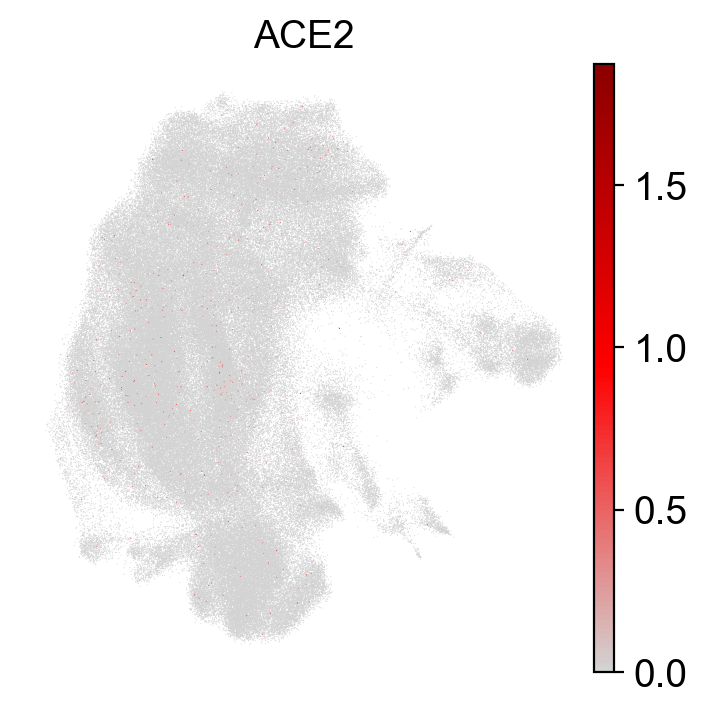

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


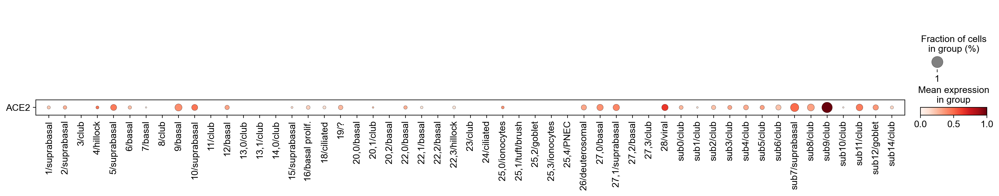

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


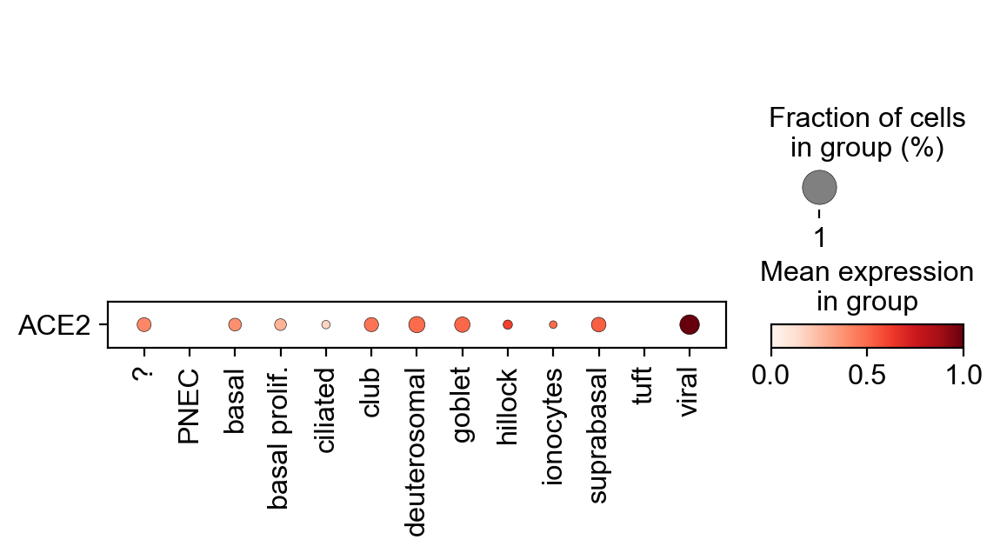

In [10]:
std_plot(['ACE2'], dot_max=.01)

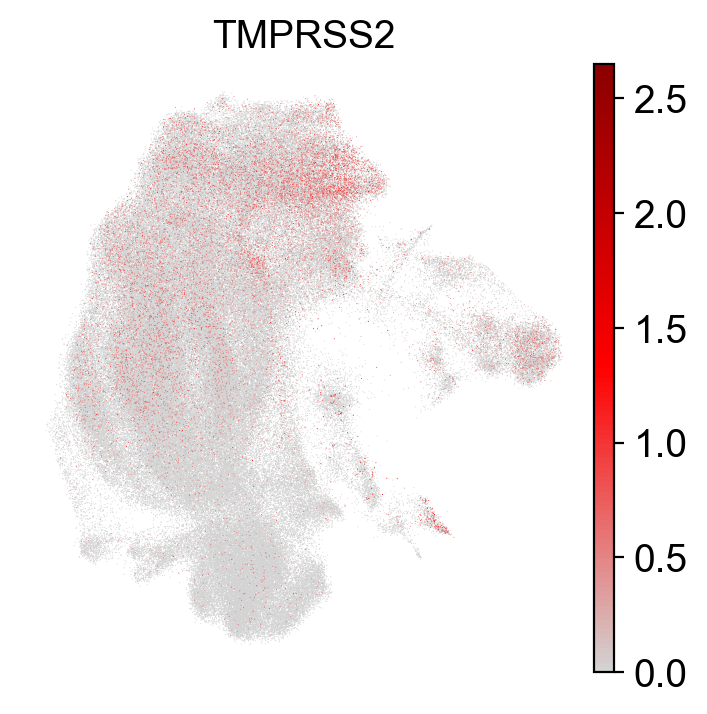

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


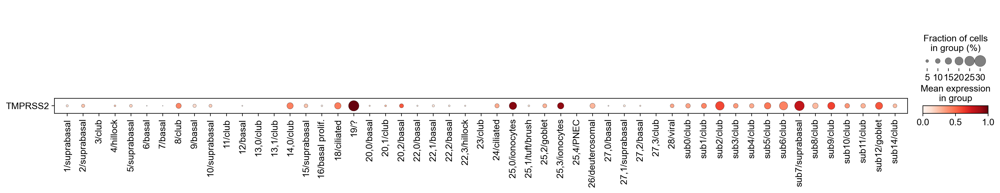

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


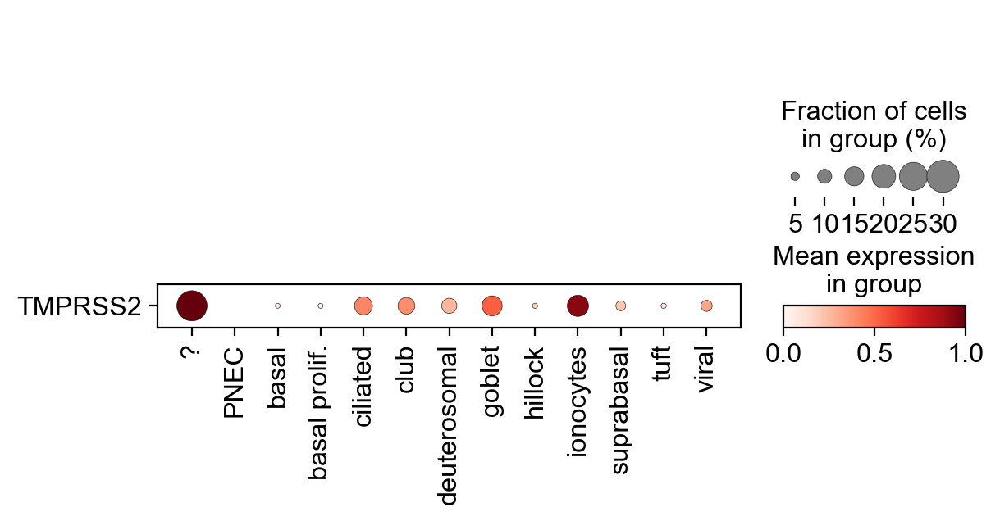

In [11]:
std_plot(['TMPRSS2'])

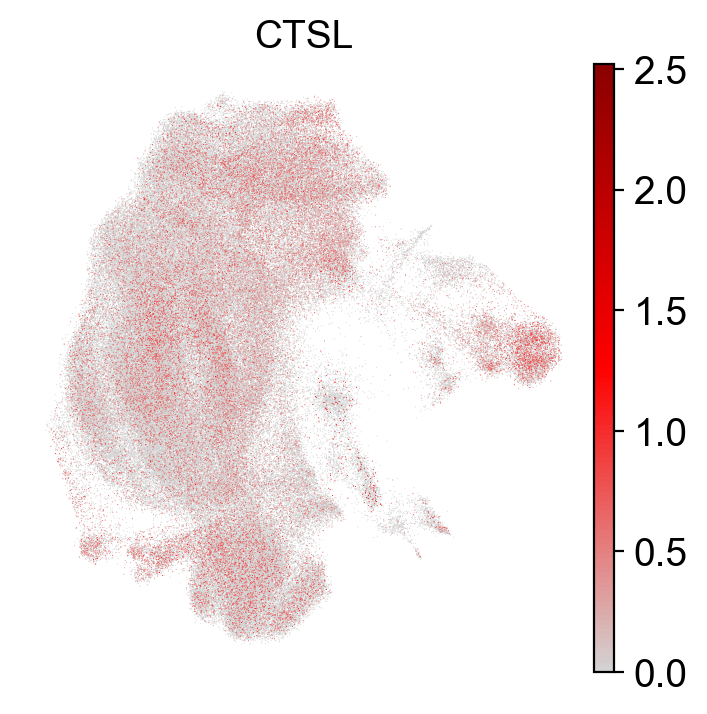

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


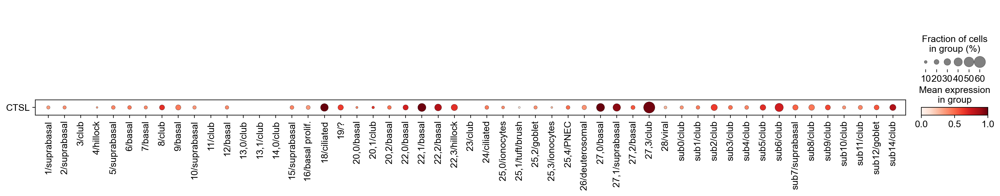

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


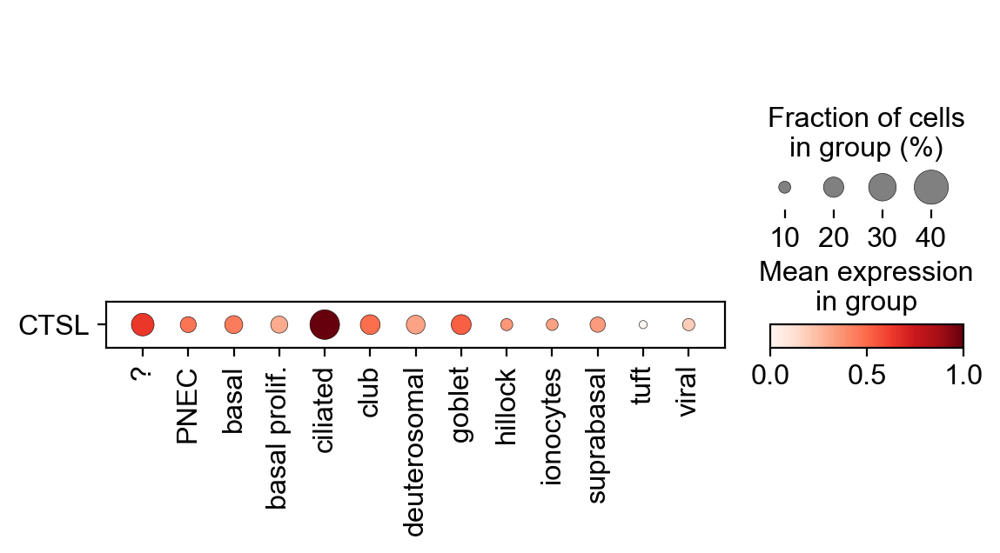

In [12]:
std_plot(['CTSL'])

SFTPB and C are AT2 markers - which one is expressed matters (why?). We see that SFTPB is expressed in the ionocyte cluster, which is strange, and SFTPC is not expressed.

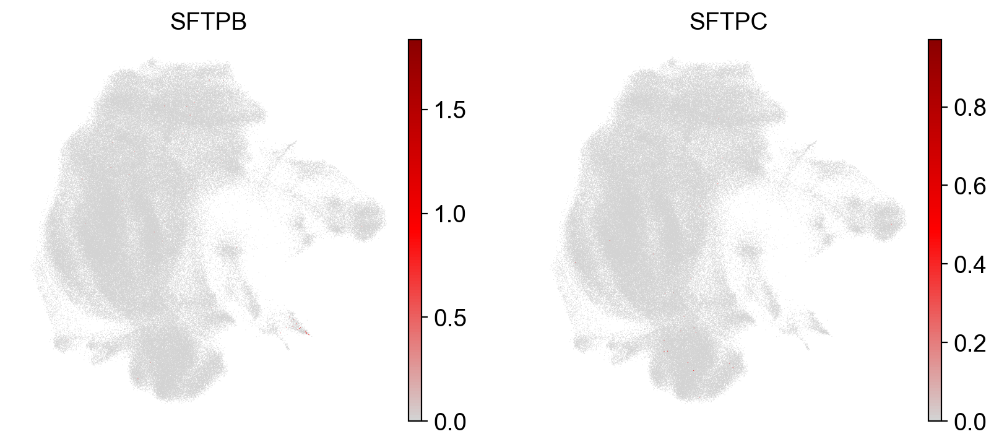

In [13]:
std_plot(['SFTPB', 'SFTPC'], dotplot=False)

Terminal airway markers.

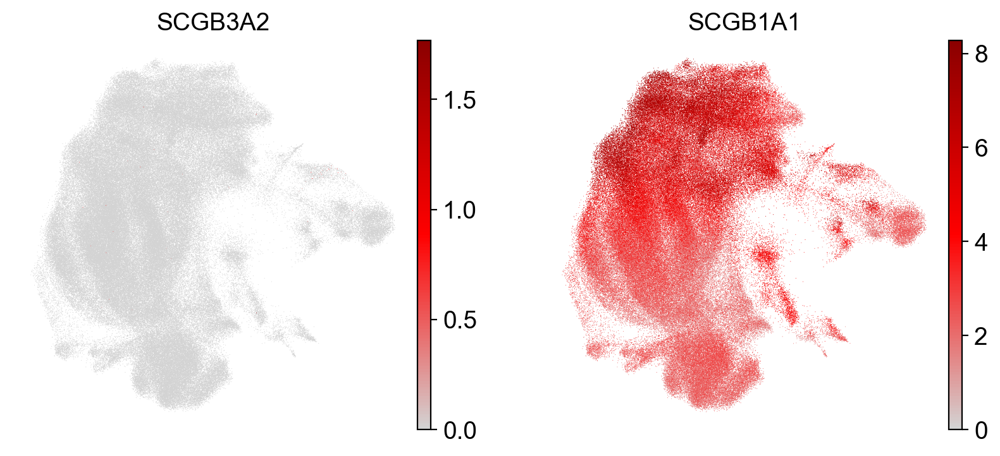

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


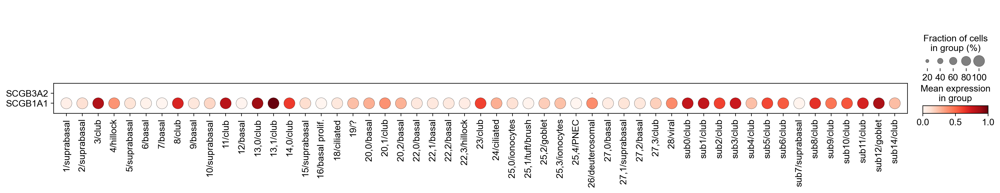

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


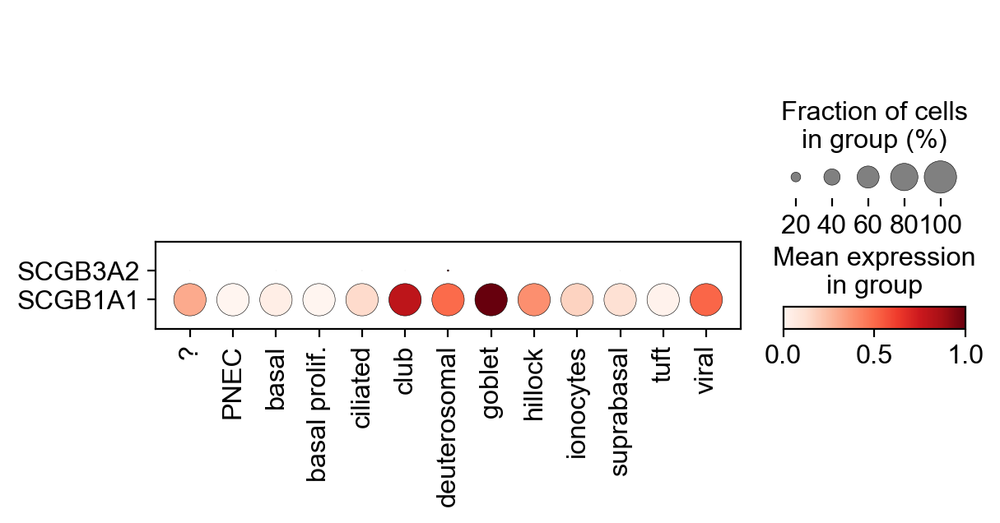

In [14]:
std_plot(['SCGB3A2', 'SCGB1A1'], dotplot=True)

Adult response clusters from Woodland.

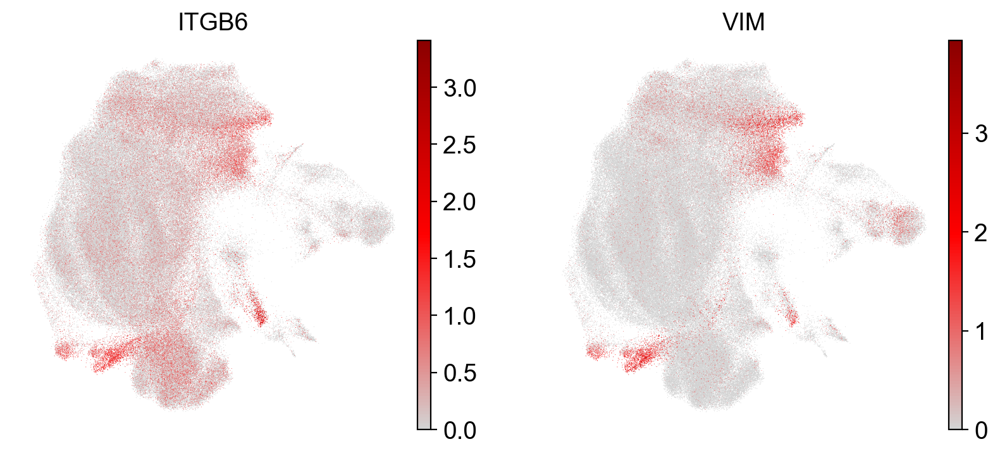

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


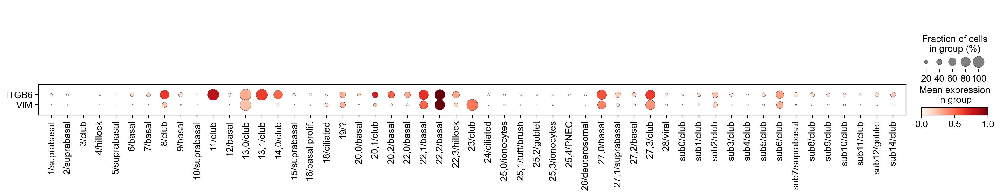

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


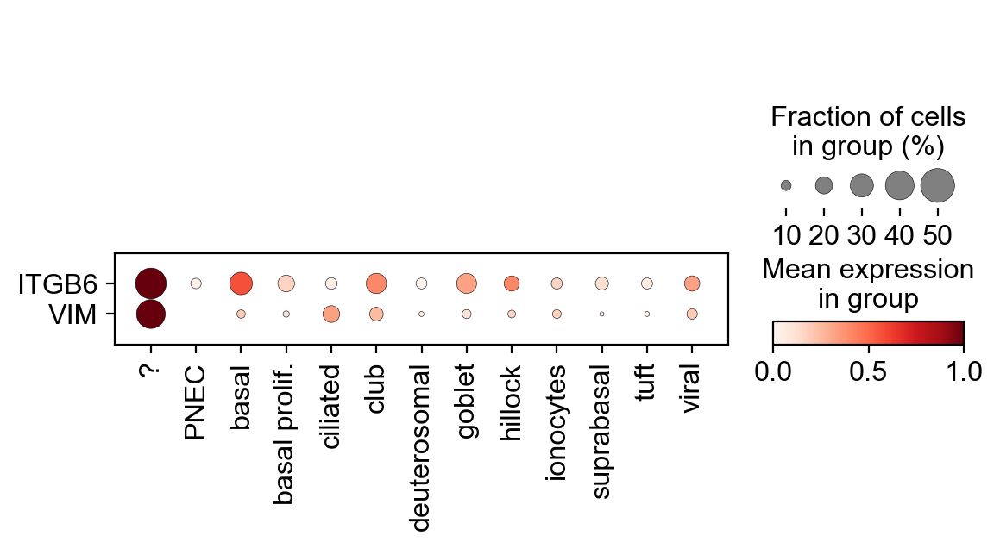

In [15]:
std_plot(['ITGB6', 'VIM'], dotplot=True)

Can we find it the other way around?

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


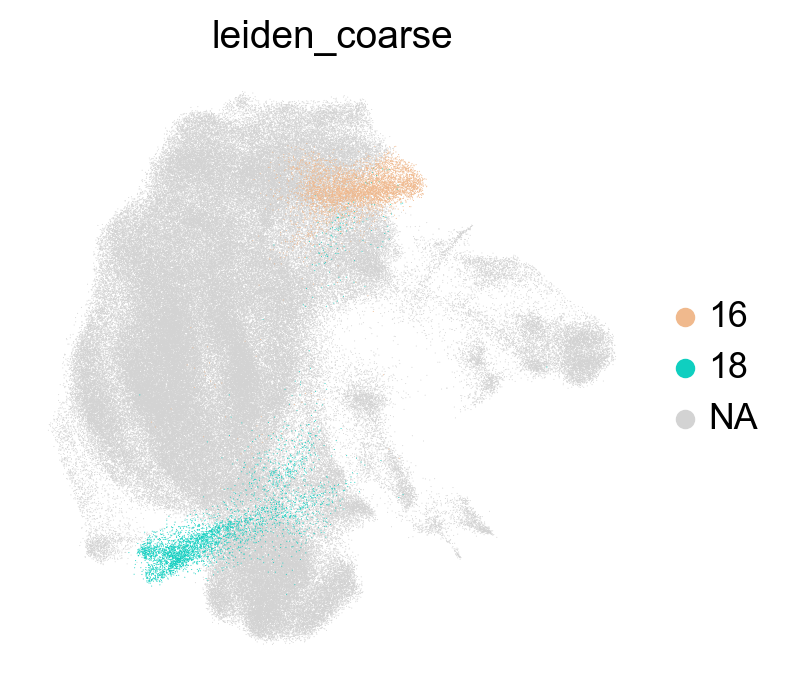

In [16]:
sc.pl.umap(adata, color='leiden_coarse', groups=['18', '16'])

In [17]:
sc.tl.rank_genes_groups(adata, groupby='leiden_coarse')

/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/yuge/miniconda3/envs/fa_base2/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:399: Perform

In [ ]:
from utils import plot_correlation

,scores,logfoldchanges,pvals,pvals_adj,scores_18,logfoldchanges_18,pvals_18,pvals_adj_18,margin,expr
names,,,,,,,,,,
KRT17,115.044403,2.051199,0.0,0.0,126.004143,2.168407,0.0,0.0,10.959740,120.524277
MARCKS,108.367996,1.671420,0.0,0.0,80.372818,1.572879,0.0,0.0,27.995178,94.370407
TPM1,81.133011,2.421620,0.0,0.0,60.374714,2.261206,0.0,0.0,20.758297,70.753860
PMEPA1,80.857315,2.996386,0.0,0.0,62.590370,2.742681,0.0,0.0,18.266945,71.723846
PLK2,75.447426,1.906854,0.0,0.0,46.102089,1.445082,0.0,0.0,29.345337,60.774757
...,...,...,...,...,...,...,...,...,...,...
CHST9,-143.220322,-2.939202,0.0,0.0,-119.268303,-2.910377,0.0,0.0,23.952019,131.244308
PLAC8,-165.858276,-3.414810,0.0,0.0,-172.562897,-3.694817,0.0,0.0,6.704620,169.210587
GSTA1,-191.238144,-3.639421,0.0,0.0,-198.136658,-4.094390,0.0,0.0,6.898514,194.687408


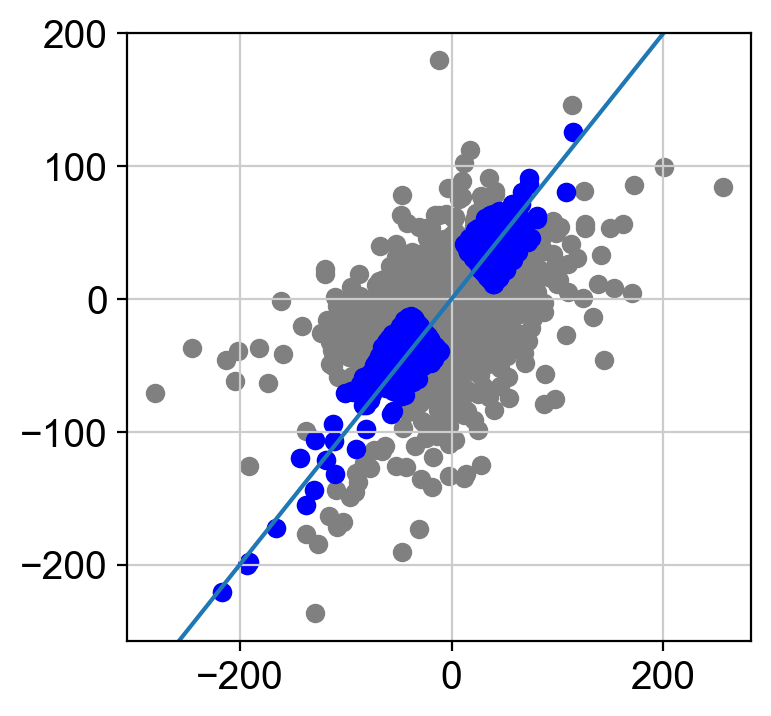

In [23]:
df = pd.concat([
    sc.get.rank_genes_groups_df(adata, group='16').set_index('names'),
    sc.get.rank_genes_groups_df(adata, group='18').set_index('names').add_suffix('_18')], axis=1)
plot_correlation(df, 'scores', 'scores_18')

In [26]:
df.loc['VIM']

scores               44.502899
logfoldchanges        3.266555
pvals                 0.000000
pvals_adj             0.000000
scores_18            50.059998
logfoldchanges_18     4.026132
pvals_18              0.000000
pvals_adj_18          0.000000
margin                5.557098
expr                 47.281448
Name: VIM, dtype: float64

Looking for MHC Class II antigen presentation in the responsive clusters.